# 데이터 불러오기

python 3.9.19  
NVIDIA-SMI 470.239.06   Driver Version: 470.239.06   CUDA Version: 11.4  
D loss: 판별자의 손실이 낮다는 것은 판별자가 가짜 데이터와 진짜 데이터를 잘 구분한다는 의미  
G loss: 생성자의 손실이 낮다는 것은 생성자가 판별자를 잘 속이고 있으며 즉, 진짜 데이터와 유사한 가짜 데이터를 효과적으로 생성하고 있다는 의미  
= D loss와 G loss는 특정 수준에서 안정적이고 서로 경쟁적인 관계를 유지하는 것이 중요  

[image info]  
width: 500, height: 500  


In [1]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

2024-05-21 12:28:51.113946: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-21 12:28:51.250241: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


4 Physical GPUs, 4 Logical GPUs


2024-05-21 12:29:03.742243: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-21 12:29:05.397174: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14825 MB memory:  -> device: 0, name: Quadro RTX 5000, pci bus id: 0000:3b:00.0, compute capability: 7.5
2024-05-21 12:29:05.398268: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 14825 MB memory:  -> device: 1, name: Quadro RTX 5000, pci bus id: 0000:5e:00.0, compute capability: 7.5
2024-05-21 12:29:05.399237: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:local

======================================

In [2]:
import cv2 as cv
import matplotlib.pyplot as plt
import os
import numpy as np
from sklearn.model_selection import train_test_split
from PIL import Image

In [3]:
dataset_directory = '/home/jeonk636/ear_classification/eardrumDs'

# 이미지 파일 경로 및 라벨을 저장할 리스트
image_paths = []

# 제외 폴더
exclude_folders = {'Earventulation', 'Foreign', 'PseduoMembran'}

# 각 폴더에 대해 이미지 파일 경로 및 해당 라벨을 리스트에 추가
for label_folder in os.listdir(dataset_directory):
    if label_folder in exclude_folders:  # 이 폴더는 건너뛴다.
        continue
    folder_path = os.path.join(dataset_directory, label_folder)
    
    for image_filename in os.listdir(folder_path):
        # 폴더 내 파일이 실제 파일인지 확인하고 '.ipynb_checkpoints' 폴더를 건너뛴다.
        full_path = os.path.join(folder_path, image_filename)
        if os.path.isfile(full_path) and '.ipynb_checkpoints' not in full_path:
            image_paths.append(full_path)


In [4]:
print(image_paths[:1])
print(len(image_paths))

['/home/jeonk636/ear_classification/eardrumDs/Aom/aom_1.tiff']
925


In [5]:
def load_and_normalize_image(image_path):
    image = Image.open(image_path)
    image = image.convert('RGB')  
    image = image.resize((64, 64))  
    image_array = np.array(image) / 255.0 
    return image_array

# 모든 이미지를 로드하고 정규화하여 리스트에 추가
images = [load_and_normalize_image(path) for path in image_paths]
images = np.array(images)

# 데이터 분할
x_train, x_test = train_test_split(images, test_size=0.2, random_state=42)

print("Training data shape:", x_train.shape)
print("Testing data shape:", x_test.shape)

Training data shape: (740, 64, 64, 3)
Testing data shape: (185, 64, 64, 3)


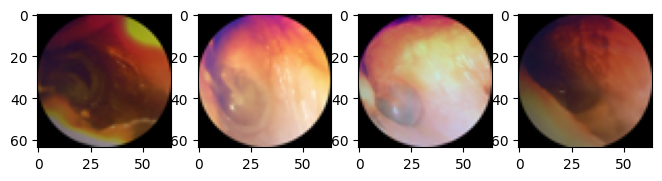

In [6]:
fig = plt.figure(figsize=(10, 10))
nplot = 5
for i in range(1, nplot):
    ax = fig.add_subplot(1, nplot, i)
    ax.imshow(x_train[i])
plt.show()

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Reshape, Input, Flatten, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers

In [8]:
# Generator 모델 정의
def generator():
    model = Sequential()
    model.add(Dense(256, use_bias=False, input_shape=(100,)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(Dense(np.prod((64, 64, 3)), activation='tanh'))
    model.add(Reshape((64, 64, 3)))
    
    noise = Input(shape=(100,))
    img = model(noise)
    model.summary()
    return Model(noise, img)

In [9]:
# Discriminator 모델 정의
def discriminator():
    model = Sequential()
    img_shape = (64, 64, 3)
    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))
    
    model.summary()
    img = Input(shape=img_shape)
    validity = model(img)
    
    return Model(img, validity)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               25600     
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 256)               0         
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 512)               131584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 512)               0         
                                                                 
 batch_normalization_1 (Batc  (None, 512)              2048      
 hNormalization)                                        

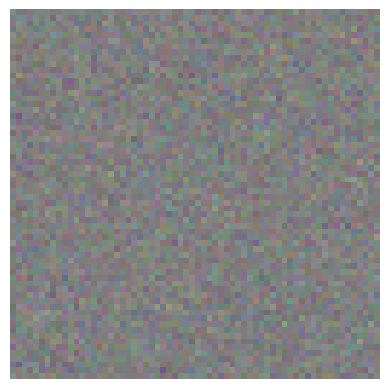

In [10]:
# Generator와 Discriminator 생성
optimizer = tf.keras.optimizers.legacy.Adam(0.0002, 0.5)
gen = generator()
gen.compile(loss='binary_crossentropy', optimizer=optimizer)

disc = discriminator()
disc.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# 랜덤 노이즈를 생성하고 이를 사용해 Generator로 이미지를 생성
noise = np.random.normal(0, 1, (1, 100))
gen_img = gen.predict(noise)

# 생성된 이미지 출력
plt.imshow((gen_img[0] + 1) / 2)  # 이미지를 [-1, 1]에서 [0, 1]로 재조정
plt.axis('off')
plt.show()

In [11]:
# Discriminator를 사용해 생성된 이미지를 분류
decision = disc(gen_img)
print(decision)

# Combined 모델 생성
z = layers.Input(shape=(100,), name="noise_input")
img = gen(z)

disc.trainable = False  # Generator 훈련 중에 Discriminator의 가중치를 고정

valid = disc(img)

combined = Model(z, valid)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)
combined.summary()

tf.Tensor([[0.5110581]], shape=(1, 1), dtype=float32)
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 noise_input (InputLayer)    [(None, 100)]             0         
                                                                 
 model (Functional)          (None, 64, 64, 3)         13284864  
                                                                 
 model_1 (Functional)        (None, 1)                 6423553   
                                                                 
Total params: 19,708,417
Trainable params: 13,281,280
Non-trainable params: 6,427,137
_________________________________________________________________


4/4 [==============================] - 0s 2ms/step
0 [D loss: 0.626988, acc.: 57.42%] [G loss: 0.708339]
1/1 [==============================] - 0s 22ms/step


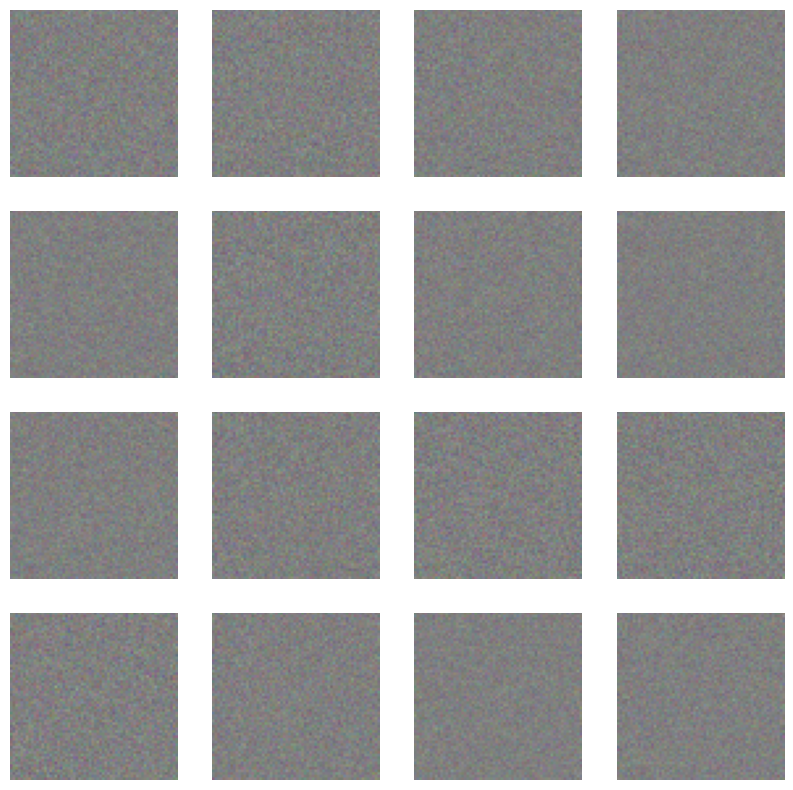

4/4 [==============================] - 0s 2ms/step
501 [D loss: 0.415163, acc.: 79.69%] [G loss: 1.232327]
1/1 [==============================] - 0s 22ms/step


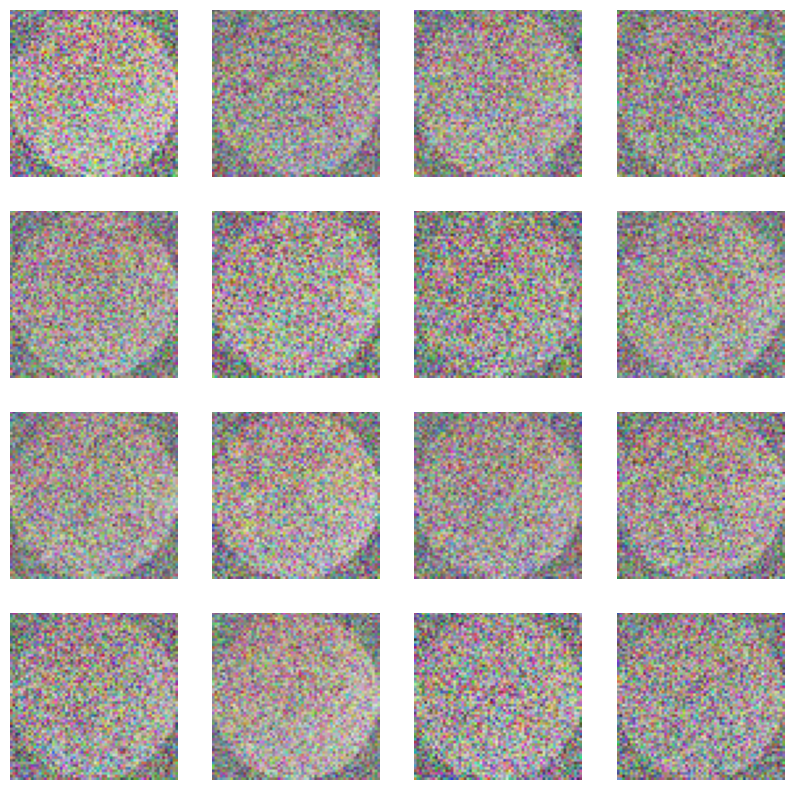

4/4 [==============================] - 0s 2ms/step
1002 [D loss: 0.735610, acc.: 44.92%] [G loss: 0.815978]
1/1 [==============================] - 0s 22ms/step


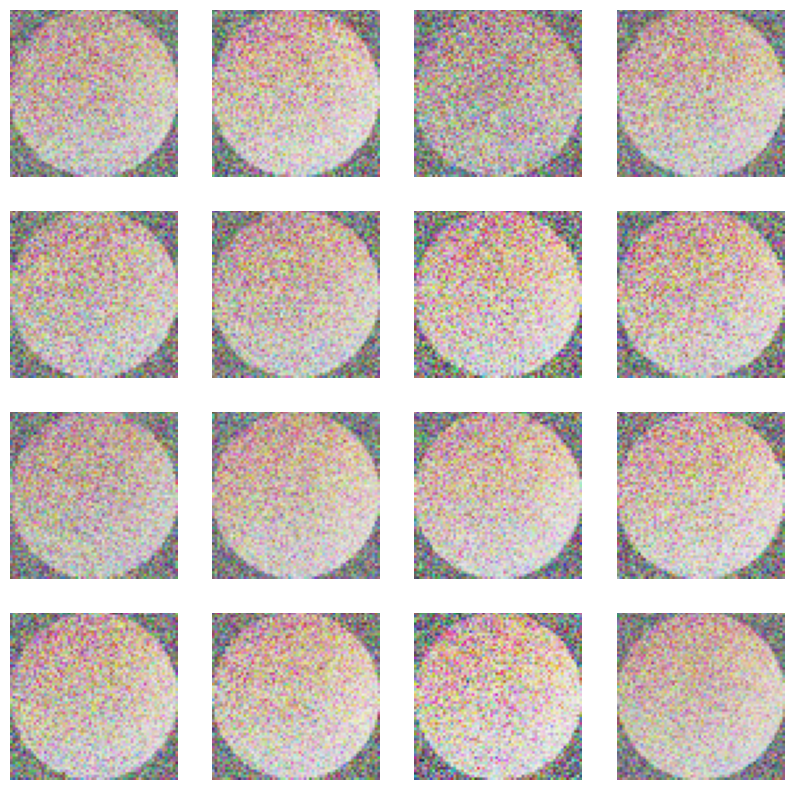

4/4 [==============================] - 0s 2ms/step
1503 [D loss: 0.740755, acc.: 48.83%] [G loss: 0.877257]
1/1 [==============================] - 0s 21ms/step


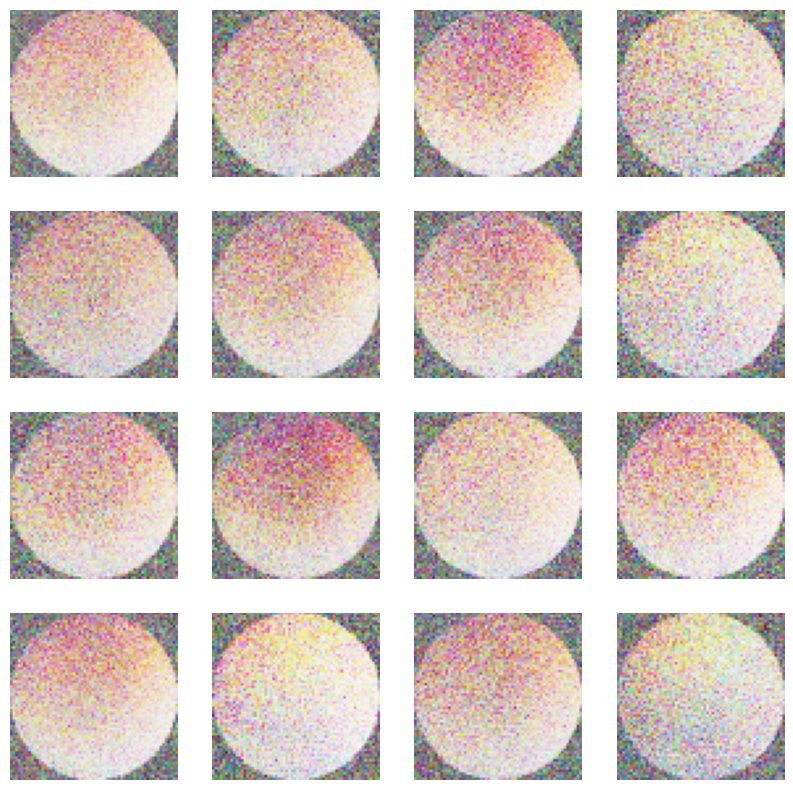

4/4 [==============================] - 0s 2ms/step
2004 [D loss: 0.758426, acc.: 42.97%] [G loss: 0.909941]
1/1 [==============================] - 0s 23ms/step


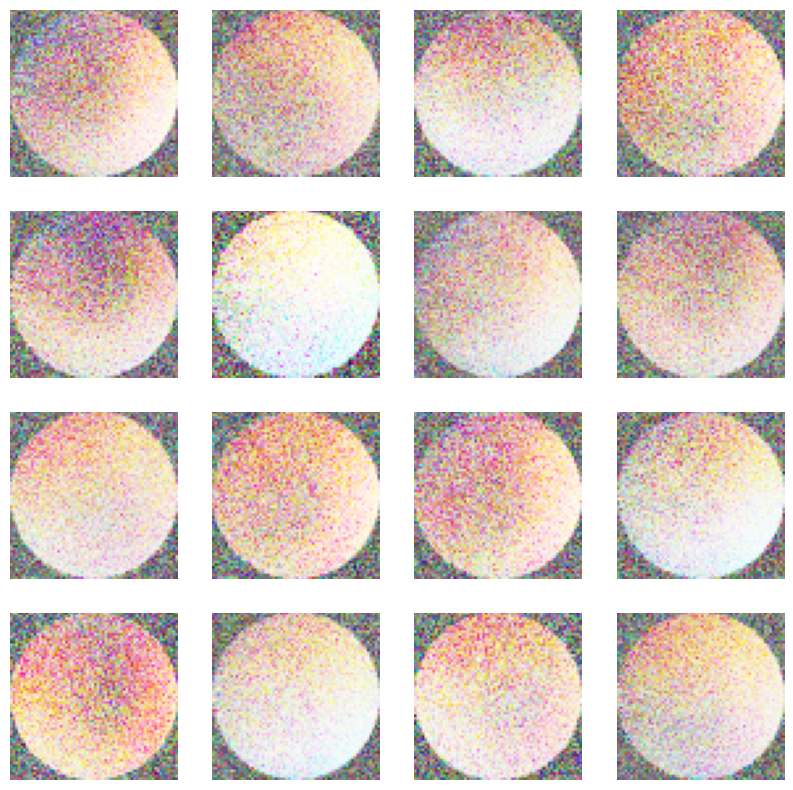

4/4 [==============================] - 0s 2ms/step
2505 [D loss: 0.720243, acc.: 53.12%] [G loss: 0.965504]
1/1 [==============================] - 0s 22ms/step


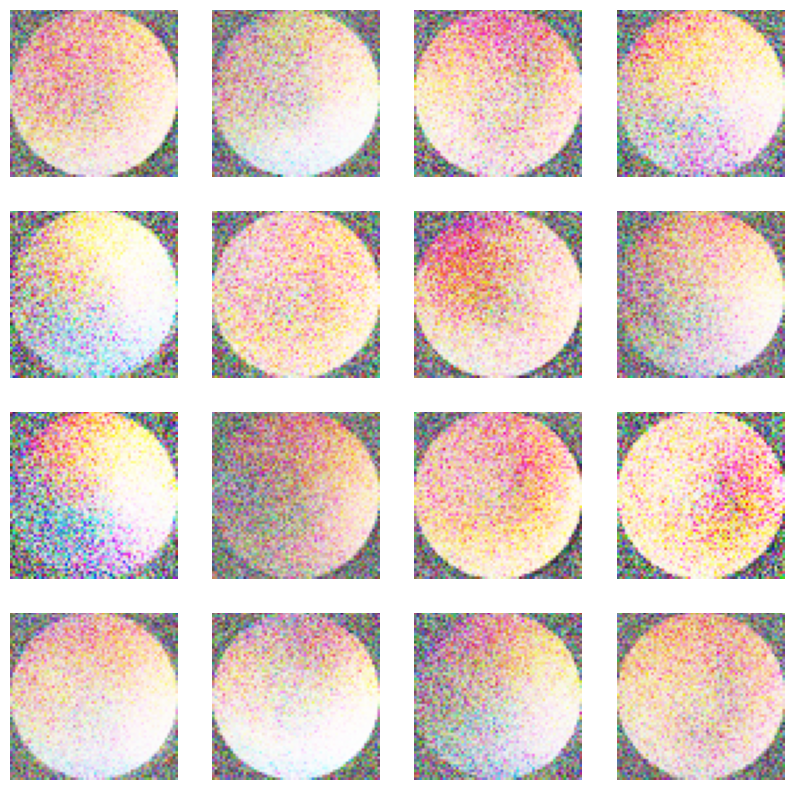

4/4 [==============================] - 0s 2ms/step
3006 [D loss: 1.062111, acc.: 9.38%] [G loss: 1.406678]
1/1 [==============================] - 0s 22ms/step


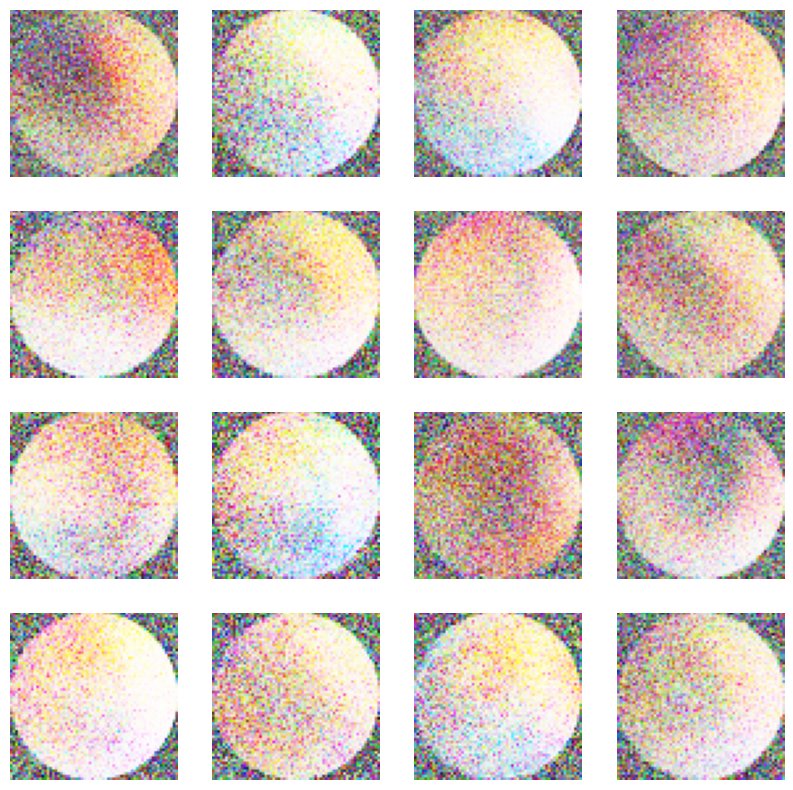

4/4 [==============================] - 0s 2ms/step
3507 [D loss: 0.631385, acc.: 62.50%] [G loss: 1.434133]
1/1 [==============================] - 0s 23ms/step


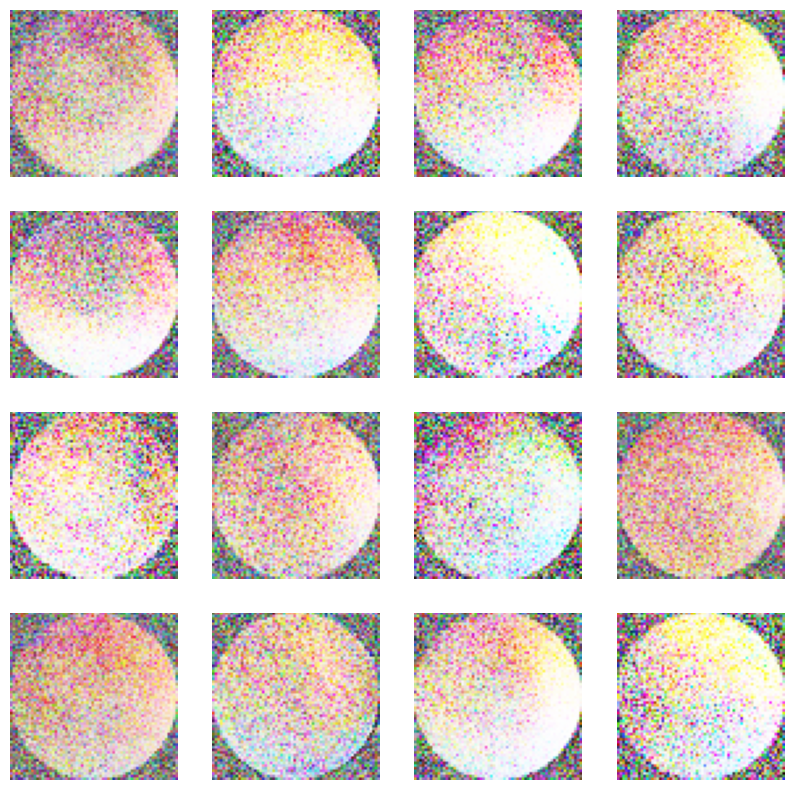

4/4 [==============================] - 0s 2ms/step
4008 [D loss: 0.482976, acc.: 75.39%] [G loss: 2.936551]
1/1 [==============================] - 0s 21ms/step


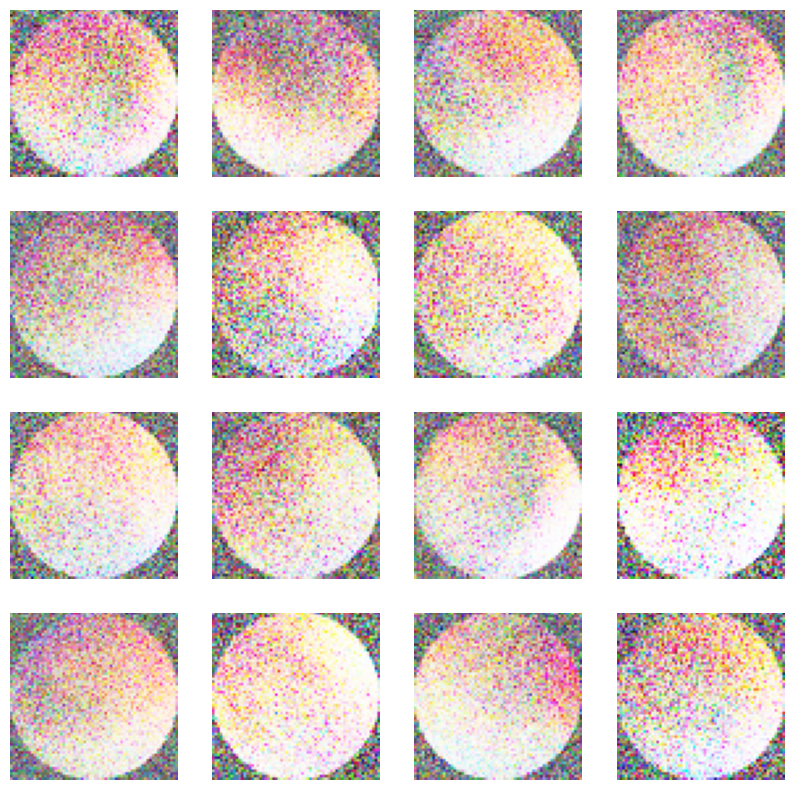

4/4 [==============================] - 0s 2ms/step
4509 [D loss: 0.502233, acc.: 64.06%] [G loss: 2.702915]
1/1 [==============================] - 0s 22ms/step


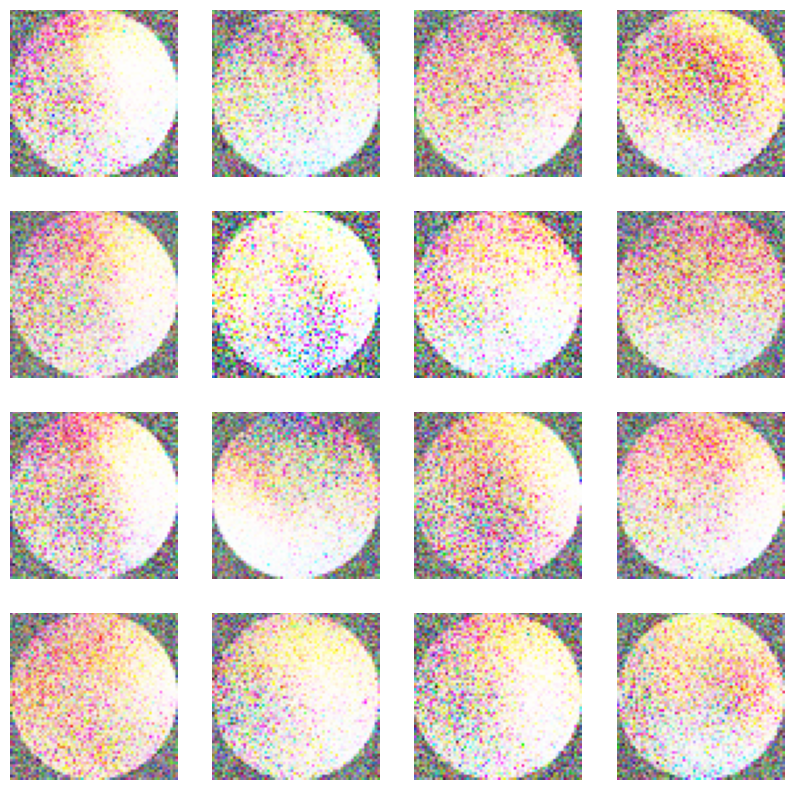

4/4 [==============================] - 0s 2ms/step


In [12]:
# 이미지 샘플링 및 출력 함수
def sample_images(epoch):
    r, c = 4, 4
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = gen.predict(noise)
    
    gen_imgs = 0.5 * gen_imgs + 0.5  # 이미지를 [-1, 1]에서 [0, 1]로 재조정
    
    fig, axs = plt.subplots(r, c, figsize=(10, 10))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt])
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# 훈련 함수
def train(epochs, batch_size, save_interval):
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))
    history = []
    
    for epoch in range(epochs):
        # Discriminator 훈련
        idx = np.random.randint(0, x_train.shape[0], batch_size)
        imgs = x_train[idx]
        
        noise = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = gen.predict(noise)
        
        d_loss_real = disc.train_on_batch(imgs, valid)
        d_loss_fake = disc.train_on_batch(gen_imgs, fake)
        
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        
        # Generator 훈련
        noise = np.random.normal(0, 1, (batch_size, 100))
        g_loss = combined.train_on_batch(noise, valid)
        
        history.append({"D": d_loss[0], "G": g_loss})
        
        # 진행 상황 출력 및 이미지 저장
        if epoch % save_interval == 0:
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100 * d_loss[1], g_loss))
            sample_images(epoch)
    
    return history


# GAN 훈련
history = train(epochs=5001, batch_size=128, save_interval=501)

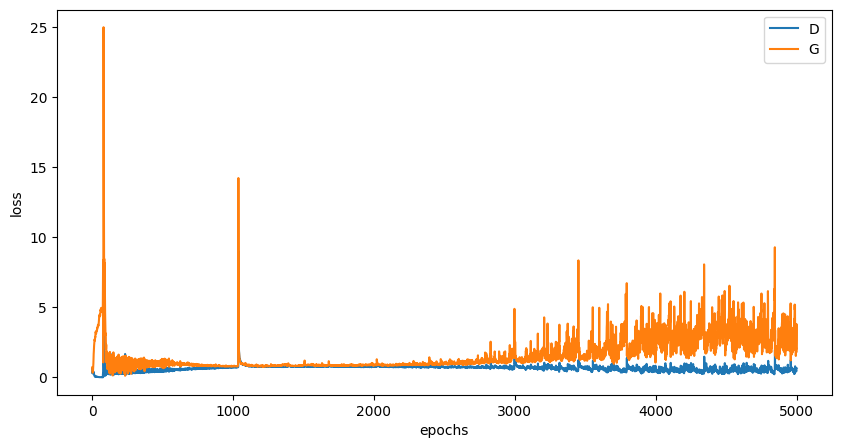

In [13]:
import pandas as pd
hist = pd.DataFrame(history)
plt.figure(figsize=(10, 5))
for colnm in hist.columns:
    plt.plot(hist[colnm], label=colnm)
plt.legend()
plt.ylabel("loss")
plt.xlabel("epochs")
plt.show()